In [53]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

from mpl_toolkits import mplot3d

import plotly
import plotly.graph_objs as go
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [1]:
#Fitting Kmeans cluster model, n_clusters=3

In [54]:
pd.set_option("display.max_columns", None)
data = pd.read_csv('kahuna.csv')
data.head()

,Entity,Year,Deaths %,CO2 Emissions,CO2 Emissions Per Cap,Food Emissions,Total GHG,Consumption of Ozone,Shared CO2 Emissions,Transport,Death_rate_ambient_ozone_pol,Death_rate_household_air_pol,Death_rate_all_causes,Death_actual_ozone,Death_actual_particulate,Death_actual_household,Death_under5,Death_5-14,Death_50-69,Death_70+,Death_15-49,Urban%,Child Mortality,Population,GDP,Forest area
0,Albania,1991,17.614,4228256,1.289,4011691.000,9030000.000,0.000,0.020,500000.000,4.361,98.112,46.052,73.711,949.199,2033.148,172.433,5.975,271.661,512.127,60.714,36.700,3.930,119.226,3496.580,786850.000
1,Albania,1995,16.789,2066496,0.664,4861321.100,7480000.000,43.400,0.010,600000.000,3.420,81.760,37.768,63.413,828.043,1792.208,127.036,4.580,240.740,469.407,49.693,38.911,3.390,116.342,4471.871,779050.000
2,Albania,1996,16.588,1993216,0.643,4569702.900,7280000.000,43.200,0.010,600000.000,3.079,80.923,38.586,58.833,858.067,1795.574,113.537,4.374,255.560,491.358,52.070,39.473,3.260,115.622,4909.228,777100.000
3,Albania,1997,15.081,1531552,0.494,4431656.700,6510000.000,45.200,0.010,500000.000,3.024,76.985,39.244,59.782,898.700,1757.485,105.434,4.414,269.449,521.197,57.988,40.035,3.130,114.901,4400.578,775150.000
4,Albania,1998,15.966,1744064,0.561,4344061.600,6810000.000,49.600,0.010,700000.000,2.600,72.162,40.057,53.195,943.590,1691.903,99.531,4.494,280.472,547.316,64.973,40.601,2.990,114.180,4819.388,773200.000


------------------

In [3]:
X = data.drop(columns=['Entity', 'Year'])
sc = StandardScaler()
X_sc = sc.fit_transform(X)

In [4]:
km = KMeans(n_clusters=3, random_state=42)
km.fit(X_sc)

KMeans(n_clusters=3, random_state=42)

In [5]:
km.cluster_centers_

array([[-2.43133886e-02, -1.41366346e-01, -1.28998926e-02,
        -1.17849822e-01, -1.39080810e-01, -8.89218657e-02,
        -1.44117526e-01, -1.18105302e-01, -7.40657806e-02,
        -1.02381540e-02, -3.75228968e-03, -1.42104572e-01,
        -1.34154277e-01, -1.34532895e-01, -1.16535450e-01,
        -1.19161320e-01, -1.37200410e-01, -1.27345929e-01,
        -1.34642371e-01,  1.33002754e-02,  1.28543106e-03,
         2.12885687e-04, -5.31887868e-03, -4.35150122e-02],
       [ 1.91682753e+00,  3.56771667e+00, -3.86958847e-01,
         3.84629760e+00,  3.73517323e+00,  2.57692302e+00,
         3.51710389e+00,  1.05166117e+00,  3.55065608e+00,
         9.20043881e-01,  6.22789388e-01,  6.58944746e+00,
         6.25171489e+00,  6.66693936e+00,  5.74943553e+00,
         5.90793892e+00,  6.42096187e+00,  5.84936697e+00,
         6.39544028e+00, -1.14611534e+00,  3.50392767e-01,
         1.08683148e-01, -6.59684491e-01,  8.41459294e-01],
       [-1.46613885e+00,  6.63011457e+00,  2.03004474e

In [6]:
data['cluster'] = km.labels_
data.head()

,Entity,Year,Deaths %,CO2 Emissions,CO2 Emissions Per Cap,Food Emissions,Total GHG,Consumption of Ozone,Shared CO2 Emissions,Transport,...,Death_5-14,Death_50-69,Death_70+,Death_15-49,Urban%,Child Mortality,Population,GDP,Forest area,cluster
0,Albania,1991,17.613636,4228256,1.2889,4011691.0,9030000.0,0.0,0.02,500000.0,...,5.975427,271.661092,512.126572,60.714220,36.700,3.93,119.225912,3496.580246,786850.0,0
1,Albania,1995,16.789055,2066496,0.6638,4861321.1,7480000.0,43.4,0.01,600000.0,...,4.580403,240.740486,469.406670,49.692924,38.911,3.39,116.342482,4471.871070,779050.0,0
2,Albania,1996,16.588451,1993216,0.6432,4569702.9,7280000.0,43.2,0.01,600000.0,...,4.373679,255.560407,491.357876,52.069689,39.473,3.26,115.621642,4909.228105,777100.0,0
3,Albania,1997,15.081361,1531552,0.4941,4431656.7,6510000.0,45.2,0.01,500000.0,...,4.414006,269.448518,521.197486,57.988035,40.035,3.13,114.900766,4400.577827,775150.0,0
4,Albania,1998,15.965796,1744064,0.5607,4344061.6,6810000.0,49.6,0.01,700000.0,...,4.493629,280.472022,547.315668,64.973478,40.601,2.99,114.179927,4819.387534,773200.0,0


In [7]:
#np.set_printoptions(suppress=True)
data.groupby('cluster').mean()

,Year,Deaths %,CO2 Emissions,CO2 Emissions Per Cap,Food Emissions,Total GHG,Consumption of Ozone,Shared CO2 Emissions,Transport,Death_rate_ambient_ozone_pol,...,Death_under5,Death_5-14,Death_50-69,Death_70+,Death_15-49,Urban%,Child Mortality,Population,GDP,Forest area
cluster,,,,,,,,,,,,,,,,,,,,,
0,2002.239623,10.696644,1.028777e+08,5.169476,1.029963e+08,1.954523e+08,1187.150385,0.370834,2.030077e+07,2.304762,...,1316.641978,34.250999,3641.860907,4986.685312,1079.753765,58.066736,4.473239,180.855579,15806.941359,3.098597e+07
1,2001.500000,19.831352,3.149207e+09,2.463833,1.432680e+09,3.915459e+09,35517.383542,10.933333,2.191417e+08,16.213795,...,60912.311895,1765.129307,228012.691542,411923.571069,56154.186658,33.544688,5.998958,249.008456,3911.556322,1.243952e+08
2,2001.500000,3.911636,5.664404e+09,19.946500,1.411459e+09,6.159870e+09,47467.956667,20.979167,1.637742e+09,3.014308,...,964.143942,7.433022,26056.717104,61425.546122,4913.515424,78.874792,0.857917,31.123859,49302.893297,3.051919e+08


In [2]:
#Checking out centroids

In [8]:
centroids = pd.DataFrame(
    sc.inverse_transform(km.cluster_centers_),
    columns=data.columns.drop(['Entity', 'cluster', 'Year'])
)
centroids

,Deaths %,CO2 Emissions,CO2 Emissions Per Cap,Food Emissions,Total GHG,Consumption of Ozone,Shared CO2 Emissions,Transport,Death_rate_ambient_ozone_pol,Death_rate_household_air_pol,...,Death_under5,Death_5-14,Death_50-69,Death_70+,Death_15-49,Urban%,Child Mortality,Population,GDP,Forest area
0,10.696644,1.028777e+08,5.169476,1.029963e+08,1.954523e+08,1187.150385,0.370834,2.030077e+07,2.304762,62.468660,...,1316.641978,34.250999,3641.860907,4986.685312,1079.753765,58.066736,4.473239,180.855579,15806.941359,3.098597e+07
1,19.831352,3.149207e+09,2.463833,1.432680e+09,3.915459e+09,35517.383542,10.933333,2.191417e+08,16.213795,132.159339,...,60912.311895,1765.129307,228012.691542,411923.571069,56154.186658,33.544688,5.998958,249.008456,3911.556322,1.243952e+08
2,3.911636,5.664404e+09,19.946500,1.411459e+09,6.159870e+09,47467.956667,20.979167,1.637742e+09,3.014308,0.072509,...,964.143942,7.433022,26056.717104,61425.546122,4913.515424,78.874792,0.857917,31.123859,49302.893297,3.051919e+08


In [3]:
#displaying inertia and silhouette across different n_cluster values

In [56]:
scores = []
for k in range(2, 31):
    cl = KMeans(n_clusters=k)
    cl.fit(X_sc)
    inertia = cl.inertia_
    sil = silhouette_score(X_sc, cl.labels_)
    scores.append([k, inertia, sil])
    
score = pd.DataFrame(scores)
score.columns = ['k', 'inertia', 'silhouette']
score.head(11)

,k,inertia,silhouette
0,2,38563.314,0.798
1,3,32001.744,0.761
2,4,25712.987,0.277
3,5,22522.354,0.279
4,6,19631.994,0.301
5,7,16958.828,0.316
6,8,14944.614,0.325
7,9,13832.446,0.326
8,10,11874.338,0.312
9,11,10624.942,0.324


In [4]:
#plotting inertia and silhouette score

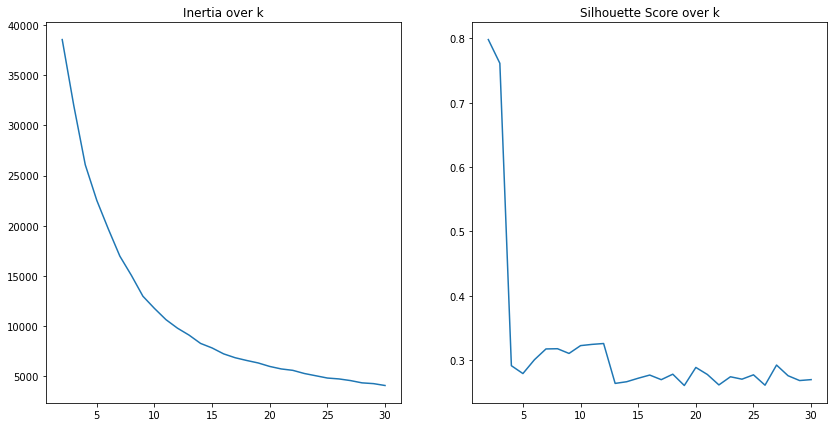

In [10]:
fig, axes = plt.subplots(1, 2, figsize=(14, 7))
axes[0].plot(score.k, score.inertia)
axes[0].set_title('Inertia over k')
axes[1].plot(score.k, score.silhouette);
axes[1].set_title('Silhouette Score over k');

In [11]:
columns=data.columns.drop(['Entity', 'cluster', 'Year'])
rev_columns = list(columns.astype(str))
rev_columns.reverse()

In [5]:
#displaying centroids in relation to dispersion across various features

/Users/kevingates/opt/anaconda3/lib/python3.9/site-packages/pandas/plotting/_matplotlib/core.py:345: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


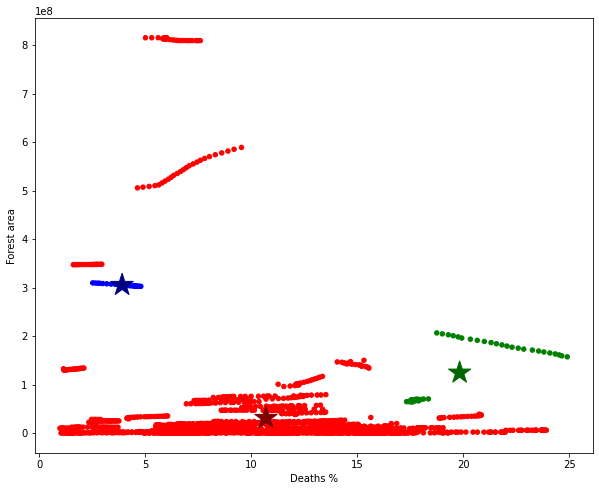

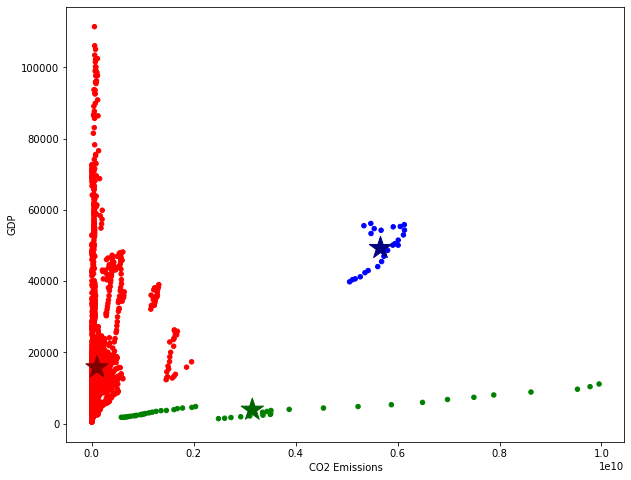

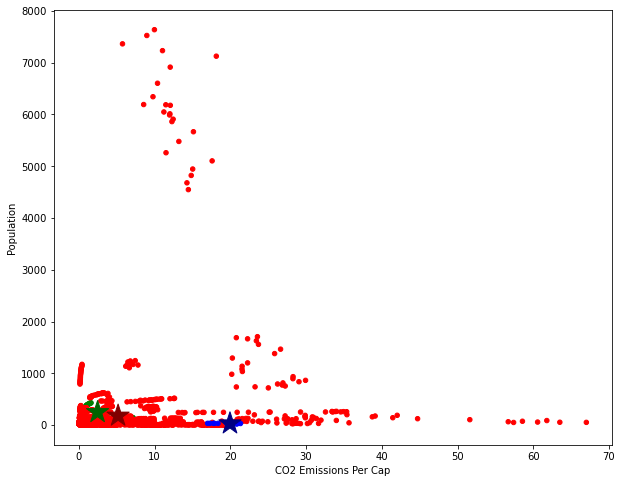

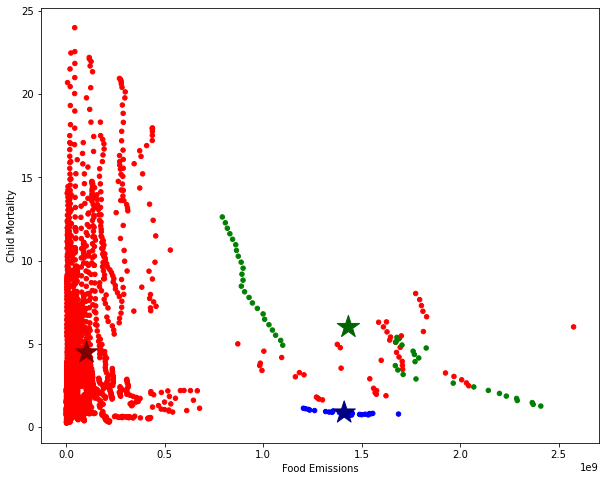

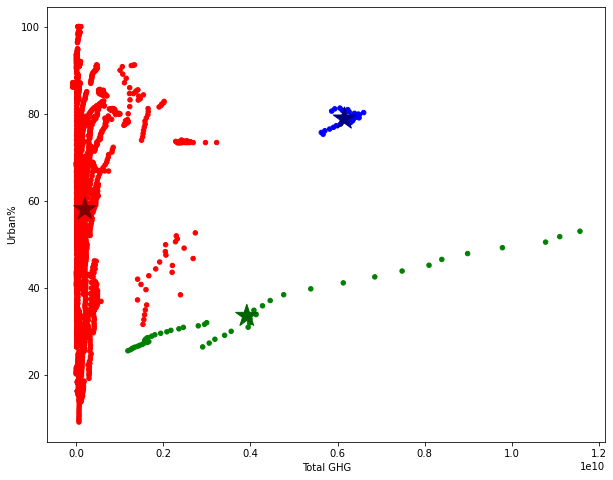

...

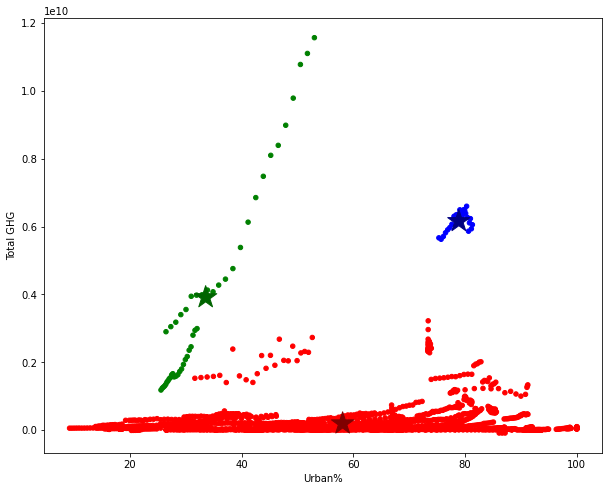

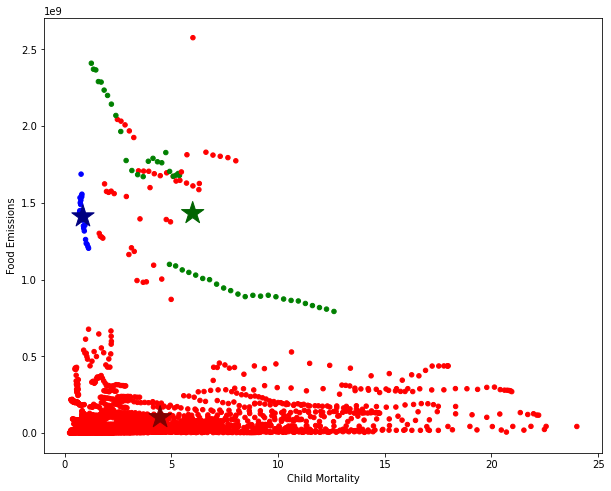

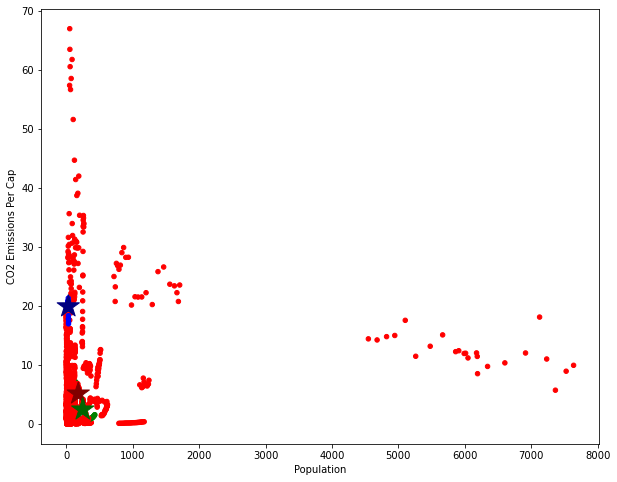

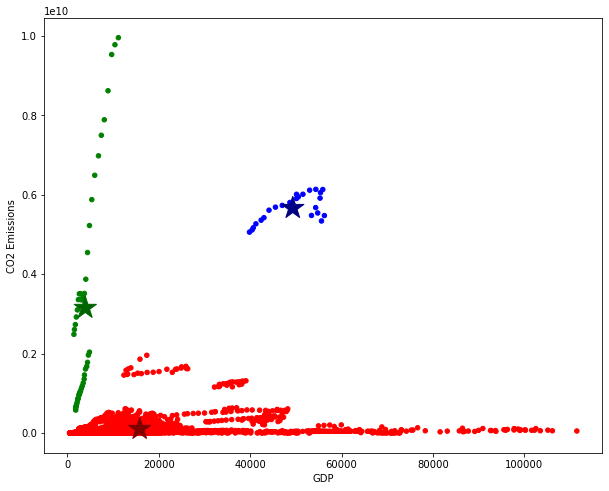

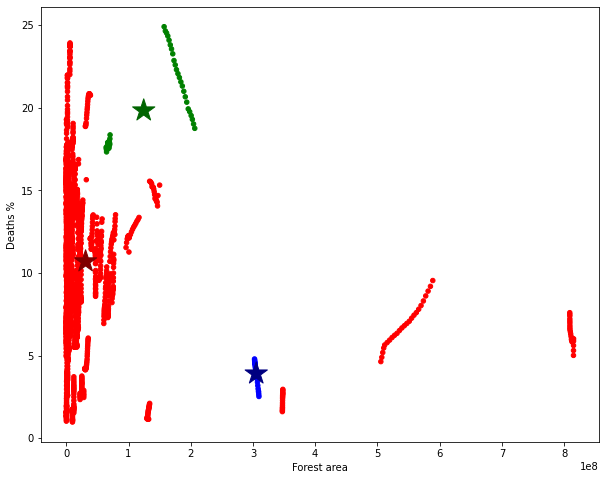

In [12]:
for x, y in zip(columns, rev_columns):
    colors = ["red", "green", "blue"]
    data['color'] = data['cluster'].map(lambda p: colors[p])

    ax = data.plot(    
        kind="scatter", 
        x=x, y=y,
        figsize=(10,8),
        c = data['color']
    )
    centroids.plot(
    kind="scatter", 
    x=x, y=y, 
    marker="*", c=["maroon", "darkgreen", "navy"], s=550,
    ax=ax
    );

----------------------

In [6]:
#subseting total features by those we want to take a closer look at with visualizations

In [13]:
#making a snapshot of the data
snap = data[['Year','Entity','CO2 Emissions','CO2 Emissions Per Cap','Total GHG','Consumption of Ozone','Urban%','Population','GDP','Forest area','Deaths %','Child Mortality','Death_rate_all_causes','Death_under5','Death_5-14','Death_70+','cluster']]
snap.head()

,Year,Entity,CO2 Emissions,CO2 Emissions Per Cap,Total GHG,Consumption of Ozone,Urban%,Population,GDP,Forest area,Deaths %,Child Mortality,Death_rate_all_causes,Death_under5,Death_5-14,Death_70+,cluster
0,1991,Albania,4228256,1.2889,9030000.0,0.0,36.700,119.225912,3496.580246,786850.0,17.613636,3.93,46.051505,172.433312,5.975427,512.126572,0
1,1995,Albania,2066496,0.6638,7480000.0,43.4,38.911,116.342482,4471.871070,779050.0,16.789055,3.39,37.768185,127.035936,4.580403,469.406670,0
2,1996,Albania,1993216,0.6432,7280000.0,43.2,39.473,115.621642,4909.228105,777100.0,16.588451,3.26,38.585679,113.537473,4.373679,491.357876,0
3,1997,Albania,1531552,0.4941,6510000.0,45.2,40.035,114.900766,4400.577827,775150.0,15.081361,3.13,39.243796,105.434149,4.414006,521.197486,0
4,1998,Albania,1744064,0.5607,6810000.0,49.6,40.601,114.179927,4819.387534,773200.0,15.965796,2.99,40.057266,99.530736,4.493629,547.315668,0


In [14]:
#adding a country's commitment to a net zero future

In [15]:
net_zero_binary = pd.read_csv('../../data/dirty_data/net-zero-target-set.csv')
net_zero_binary.head()

,Entity,Code,Year,Is there a net-zero target?
0,Antigua and Barbuda,ATG,2040,Yes
1,Australia,AUS,2050,Yes
2,Austria,AUT,2040,Yes
3,Bahrain,BHR,2060,Yes
4,Barbados,BRB,2030,Yes


In [16]:
len(net_zero_binary.Entity.unique())

66

In [17]:
nz_list = net_zero_binary.Entity.unique()

In [18]:
nz=[]
nz_bin=[]
for country in snap.Entity:
    if country in nz_list:
        nz.append('Yes')
        nz_bin.append(1)
    else:
        nz.append('No')
        nz_bin.append(0)


In [19]:
len(nz), len(nz_bin)

(2409, 2409)

In [20]:
snap.shape

(2409, 17)

In [21]:
snap['net_zero'] = nz

/var/folders/t7/10pc37nd7nd77w12vtbk6_5m0000gn/T/ipykernel_25441/1497714533.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  snap['net_zero'] = nz


In [22]:
snap['net_zero_bin'] = nz_bin

/var/folders/t7/10pc37nd7nd77w12vtbk6_5m0000gn/T/ipykernel_25441/952615607.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  snap['net_zero_bin'] = nz_bin


In [23]:
snap.head()

,Year,Entity,CO2 Emissions,CO2 Emissions Per Cap,Total GHG,Consumption of Ozone,Urban%,Population,GDP,Forest area,Deaths %,Child Mortality,Death_rate_all_causes,Death_under5,Death_5-14,Death_70+,cluster,net_zero,net_zero_bin
0,1991,Albania,4228256,1.2889,9030000.0,0.0,36.700,119.225912,3496.580246,786850.0,17.613636,3.93,46.051505,172.433312,5.975427,512.126572,0,No,0
1,1995,Albania,2066496,0.6638,7480000.0,43.4,38.911,116.342482,4471.871070,779050.0,16.789055,3.39,37.768185,127.035936,4.580403,469.406670,0,No,0
2,1996,Albania,1993216,0.6432,7280000.0,43.2,39.473,115.621642,4909.228105,777100.0,16.588451,3.26,38.585679,113.537473,4.373679,491.357876,0,No,0
3,1997,Albania,1531552,0.4941,6510000.0,45.2,40.035,114.900766,4400.577827,775150.0,15.081361,3.13,39.243796,105.434149,4.414006,521.197486,0,No,0
4,1998,Albania,1744064,0.5607,6810000.0,49.6,40.601,114.179927,4819.387534,773200.0,15.965796,2.99,40.057266,99.530736,4.493629,547.315668,0,No,0


In [24]:
snap.net_zero.value_counts()

No     1532
Yes     877
Name: net_zero, dtype: int64

In [25]:
snap.net_zero_bin.value_counts()

0    1532
1     877
Name: net_zero_bin, dtype: int64

In [7]:
#Using groupby's to investigate feature relationships across cluster and country

In [26]:
# settings to display all columns
pd.set_option("display.max_columns", None)

In [27]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
snap.drop(columns=['Year']).groupby(['Entity', 'cluster']).mean()

,,CO2 Emissions,CO2 Emissions Per Cap,Total GHG,Consumption of Ozone,Urban%,Population,GDP,Forest area,Deaths %,Child Mortality,Death_rate_all_causes,Death_under5,Death_5-14,Death_70+,net_zero_bin
Entity,cluster,,,,,,,,,,,,,,,
Albania,0,3616001.600,1.186,8673000.000,28.443,45.722,110.835,7588.821,777494.300,13.945,2.251,40.990,63.388,3.154,709.196,0.000
Algeria,0,101880830.957,3.117,140026956.522,1124.284,62.128,13.659,9622.430,1736482.609,11.005,3.572,95.676,1413.454,41.018,7554.208,0.000
Angola,0,18959183.100,0.913,176354000.000,61.114,53.927,15.597,6246.750,74973268.800,12.211,16.538,25.649,1236.580,29.515,501.776,0.000
Argentina,0,150264818.500,3.984,400927500.000,3605.673,89.330,13.683,19379.664,32620025.000,4.838,1.962,29.528,346.063,6.034,6720.933,0.000
Armenia,0,4145867.550,1.393,7356500.000,84.458,64.198,105.383,6959.846,331704.750,12.996,2.543,91.818,72.981,1.959,1742.961,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Uruguay,0,5917661.292,1.788,15386666.667,147.289,92.502,18.852,15578.820,1421072.917,3.116,1.563,17.918,17.142,0.151,520.163,1.000
Uzbekistan,0,115503679.667,4.506,215160952.381,88.336,47.454,60.581,3466.677,3075036.581,15.526,5.182,162.361,2476.389,143.125,8093.882,0.000
Vietnam,0,85192578.136,1.002,148390454.545,420.894,26.647,261.897,3772.029,12209590.909,15.599,2.879,39.473,1178.127,16.772,12851.832,1.000


In [28]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
snap.drop(columns=['Year']).groupby(['Entity', 'cluster']).mean().T

Entity,Albania,Algeria,Angola,Argentina,Armenia,Australia,Austria,Azerbaijan,Bahrain,Bangladesh,Belarus,Benin,Bolivia,Bosnia and Herzegovina,Botswana,Brazil,Brunei,Bulgaria,Cambodia,Cameroon,Canada,Chile,China,Colombia,Congo,Costa Rica,Croatia,Cyprus,Czechia,Democratic Republic of Congo,Dominican Republic,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Finland,Gabon,Georgia,Ghana,Guatemala,Haiti,Honduras,Hungary,Iceland,India,Indonesia,Iran,Iraq,Israel,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kuwait,Kyrgyzstan,Latvia,Lebanon,Libya,Lithuania,Malaysia,Malta,Mauritius,Mexico,Moldova,Mongolia,Morocco,Mozambique,Myanmar,Namibia,Nepal,New Zealand,Nicaragua,Niger,Nigeria,North Macedonia,Norway,Oman,Pakistan,Panama,Paraguay,Peru,Philippines,Poland,Qatar,Romania,Russia,Saudi Arabia,Senegal,Singapore,Slovakia,Slovenia,South Africa,South Korea,Sri Lanka,Sudan,Suriname,Sweden,Switzerland,Tajikistan,Tanzania,Thailand,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,Ukraine,United Arab Emirates,United States,Uruguay,Uzbekistan,Vietnam,Zambia,Zimbabwe
cluster,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0
CO2 Emissions,3616001.600,101880830.957,18959183.100,150264818.500,4145867.550,356715511.720,61961985.800,32052830.944,19635394.750,33340031.375,61859085.000,2356228.750,11696346.714,14791007.810,3746728.652,353896480.000,6019810.500,54443908.765,3250083.700,4033628.042,564303652.611,56300949.000,5171744122.625,64739677.292,1437816.455,6045626.522,21006826.778,6273365.429,128701200.636,1779429.150,17855969.000,26846378.920,144534403.760,5646171.750,16972910.222,5122311.526,56908476.600,4659608.955,5419804.143,7358219.833,9533749.560,1662284.150,6225697.476,61913671.769,3134813.200,1126670762.917,331177953.542,400432667.000,92524557.933,60972792.316,9328606.625,1242094318.458,16826628.875,196104671.684,8876505.417,68533570.053,6449010.455,8096942.222,16459542.217,51941941.375,13941125.667,149840813.800,2588192.000,2905246.667,415780457.880,5541333.000,13796362.952,39394838.040,1838231.762,9713014.909,2205824.522,3021019.696,32730498.625,3699907.720,1046279.800,75070507.333,10273332.571,41699958.333,30730526.833,116910654.160,6406776.480,4056708.333,33222383.320,69443541.560,348275429.571,59724914.429,109134670.533,1596899777.217,371807592.958,4667115.417,49664902.333,43465822.182,15933873.222,400160657.667,466873248.391,10058780.320,15357090.500,2012624.071,58032468.400,44103699.500,2518015.263,4489567.727,189585486.625,1538252.360,31054065.200,20289502.167,241889625.000,45329176.565,341682321.182,110892322.417,5664404257.417,5917661.292,115503679.667,85192578.136,2579400.400,11924064.739
CO2 Emissions Per Cap,1.186,3.117,0.913,3.984,1.393,17.980,7.912,3.755,24.395,0.247,6.362,0.297,1.296,3.995,2.182,1.959,17.285,6.637,0.239,0.241,17.394,3.570,3.915,1.589,0.395,1.475,4.770,7.093,12.478,0.034,2.020,2.012,1.954,0.948,12.102,0.066,11.277,3.584,1.269,0.352,0.758,0.182,0.853,6.020,10.512,1.012,1.481,5.871,3.503,9.442,3.507,9.752,3.014,12.449,0.261,29.121,1.289,3.360,3.750,8.823,3.949,6.007,6.773,2.411,4.061,1.323,5.243,1.313,0.091,0.202,1.146,0.121,8.250,0.701,0.068,0.558,5.034,9.101,11.214,0.766,1.967,0.729,1.227,0.848,9.072,51.333,4.877,10.975,16.052,0.443,12.252,8.070,8.015,8.746,9.763,0.517,0.419,3.946,6.682,6.071,0.375,0.116,2.965,0.289,23.918,2.061,3.685,9.543,7.069,26.361,19.947,1.788,4.506,1.002,0.230,1.000
Total GHG,8673000.000,140026956.522,176354000.000,400927500.000,7356500.000,581838000.000,64146000.000,63031666.667,26818750.000,144742916.667,72179565.217,21549166.667,126287142.857,16968571.429,65228260.870,1597598800.000,18494166.667,55960000.000,53801000.000,189089166.667,853872222.222,52291666.667,6012859583.333,281636250.000,35966363.636,9872608.696,16660555.556,7122142.857,132711818.182,209345000.000,18397916.667,86842000.000,208829200.000,12137500.00

In [29]:
#THIS IS ACTUALLY REMARKABLE, CLUSTER 1 ONLY INCLUDES CHINA AND INDIA AND CLUSTER 2 ONLY INCLUDES THE US!

In [30]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
snap.drop(columns=['Year']).groupby(['cluster', 'Entity']).mean()

CO2 Emissions  CO2 Emissions Per Cap      Total GHG  \
cluster Entity                                                               
0       Albania          3616001.600                  1.186    8673000.000   
        Algeria        101880830.957                  3.117  140026956.522   
        Angola          18959183.100                  0.913  176354000.000   
        Argentina      150264818.500                  3.984  400927500.000   
        Armenia          4145867.550                  1.393    7356500.000   
...                              ...                    ...            ...   
        Zambia           2579400.400                  0.230  455966000.000   
        Zimbabwe        11924064.739                  1.000   67426521.739   
1       China         5171744122.625                  3.915 6012859583.333   
        India         1126670762.917                  1.012 1818057500.000   
2       United States 5664404257.417                 19.947 6159869583.333   

                       Consumption of Ozone  Urban%  Population       GDP  \
cluster Entity                                                              
0       Albania                      28.443  45.722     110.835  7588.821   
        Algeria                    1124.284  62.128      13.659  9622.430   
        Angola                       61.114  53.927      15.597  6246.750   
        Argentina                  3605.673  89.330      13.683 19379.664   
        Armenia                      84.458  64.198     105.383  6959.846   
...                                     ...     ...         ...       ...   
        Zambia                       28.745  37.692      15.077  2415.007   
        Zimbabwe                    423.191  32.996      31.246  3132.164   
1       China                     62125.985  38.684     134.161  4873.012   
        India                      8908.782  28.406     363.856  2950.100   
2       United States             47467.957  78.875      31.124 49302.893   

                        Forest area  Deaths %  Child Mortality  \
cluster Entity                                                   
0       Albania          777494.300    13.945            2.251   
        Algeria         1736482.609    11.005            3.572   
        Angola         74973268.800    12.211           16.538   
        Argentina      32620025.000     4.838            1.962   
        Armenia          331704.750    12.996            2.543   
...                             ...       ...              ...   
        Zambia         46921448.000    10.058           12.937   
        Zimbabwe       18229773.043     8.284            8.852   
1       China         181295317.458    21.914            3.300   
        India          67495141.667    17.749            8.698   
2       United States 305191875.000     3.912            0.858   

                       Death_rate_all_causes  Death_under5  Death_5-14  \
cluster Entity                                                           
0       Albania                       40.990        63.388       3.154   
        Algeria                       95.676      1413.454      41.018   
        Angola                        25.649      1236.580      29.515   
        Argentina                     29.528       346.063       6.034   
        Armenia                       91.818        72.981       1.959   
...                                      ...           ...         ...   
        Zambia                        26.387       730.975      18.630   
        Zimbabwe                      33.444       653.615       9.241   
1       China                         89.696     29231.634     877.914   
        India                         70.346     92592.990    2652.345   
2       United States                 20.981       964.144       7.433   

                       Death_70+  net_zero_bin  
cluster Entity                                  
0       Albania          709.196         0.000  
        Algeria         7554.208     

In [31]:
#Creating Visuals

In [32]:
snap.head()

,Year,Entity,CO2 Emissions,CO2 Emissions Per Cap,Total GHG,Consumption of Ozone,Urban%,Population,GDP,Forest area,Deaths %,Child Mortality,Death_rate_all_causes,Death_under5,Death_5-14,Death_70+,cluster,net_zero,net_zero_bin
0,1991,Albania,4228256,1.289,9030000.000,0.000,36.700,119.226,3496.580,786850.000,17.614,3.930,46.052,172.433,5.975,512.127,0,No,0
1,1995,Albania,2066496,0.664,7480000.000,43.400,38.911,116.342,4471.871,779050.000,16.789,3.390,37.768,127.036,4.580,469.407,0,No,0
2,1996,Albania,1993216,0.643,7280000.000,43.200,39.473,115.622,4909.228,777100.000,16.588,3.260,38.586,113.537,4.374,491.358,0,No,0
3,1997,Albania,1531552,0.494,6510000.000,45.200,40.035,114.901,4400.578,775150.000,15.081,3.130,39.244,105.434,4.414,521.197,0,No,0
4,1998,Albania,1744064,0.561,6810000.000,49.600,40.601,114.180,4819.388,773200.000,15.966,2.990,40.057,99.531,4.494,547.316,0,No,0


In [33]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
snap.drop(columns='Year').groupby('cluster').mean().T


cluster,0,1,2
CO2 Emissions,102877714.826,3149207442.771,5664404257.417
CO2 Emissions Per Cap,5.169,2.464,19.947
Total GHG,195452293.539,3915458541.667,6159869583.333
Consumption of Ozone,1187.150,35517.384,47467.957
Urban%,58.067,33.545,78.875
Population,180.856,249.008,31.124
GDP,15806.941,3911.556,49302.893
Forest area,30985970.730,124395229.562,305191875.000
Deaths %,10.697,19.831,3.912
Child Mortality,4.473,5.999,0.858


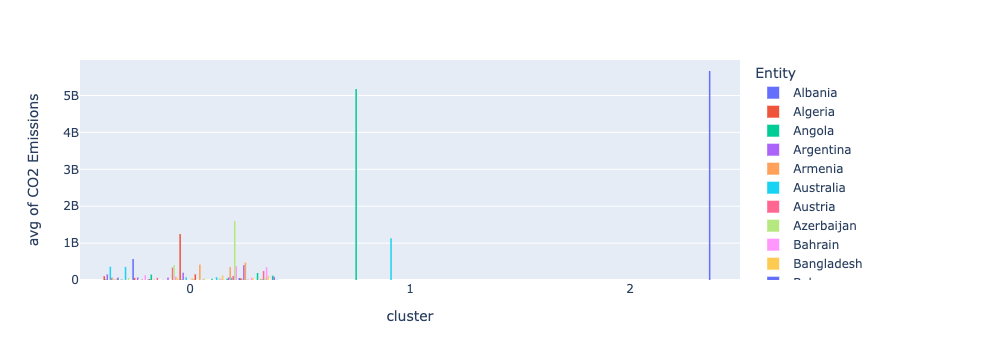

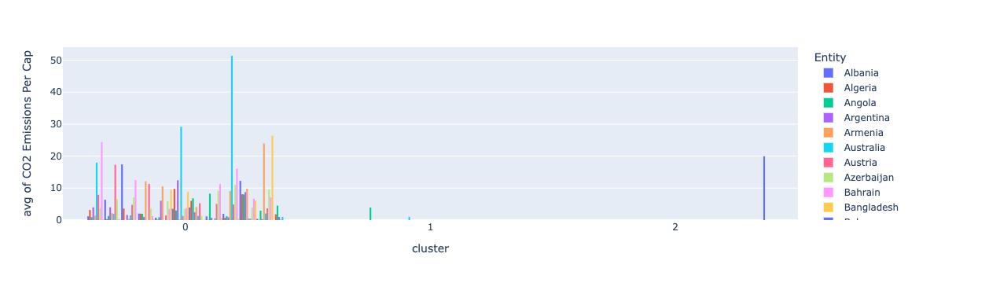

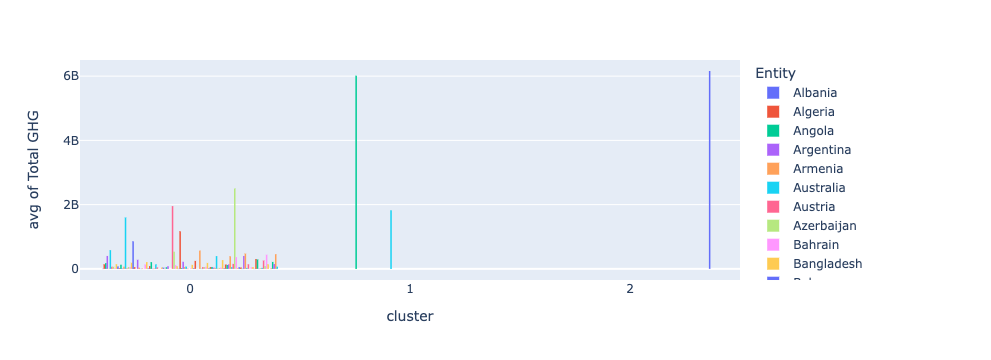

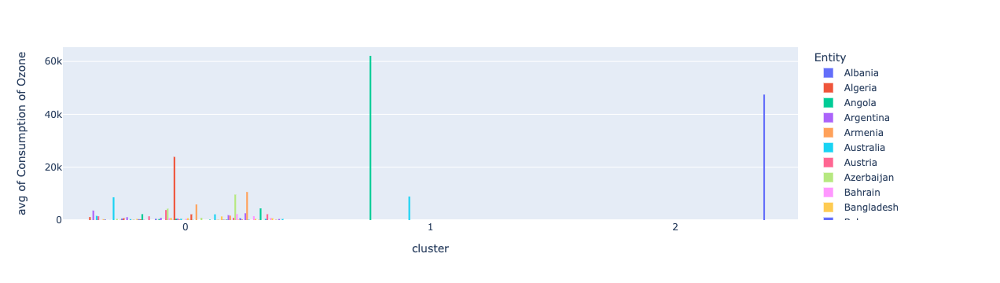

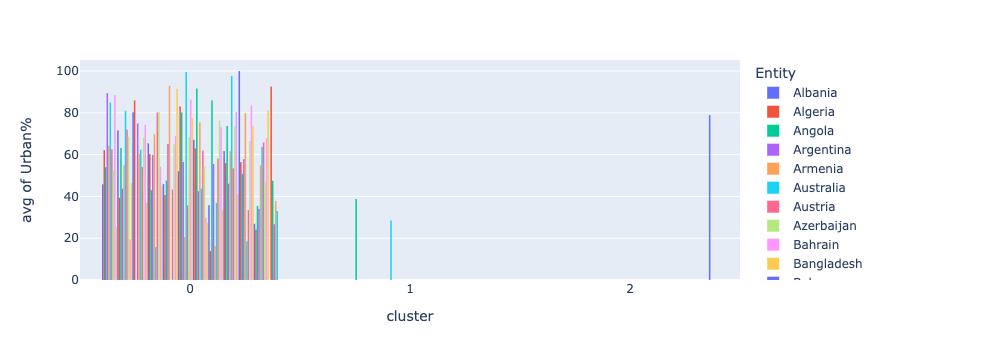

...

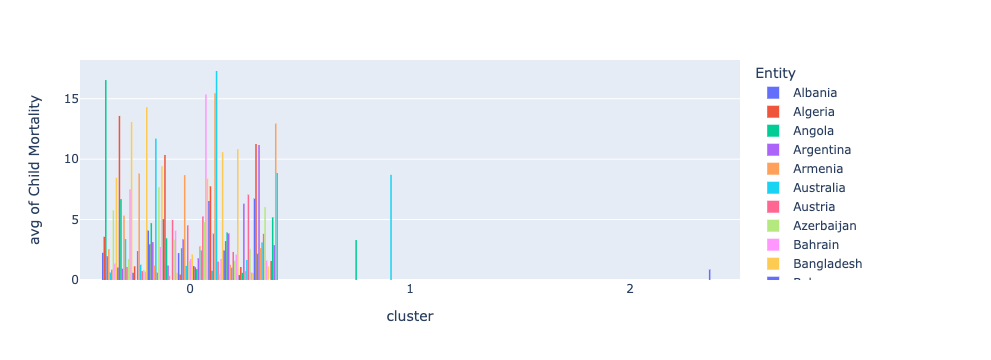

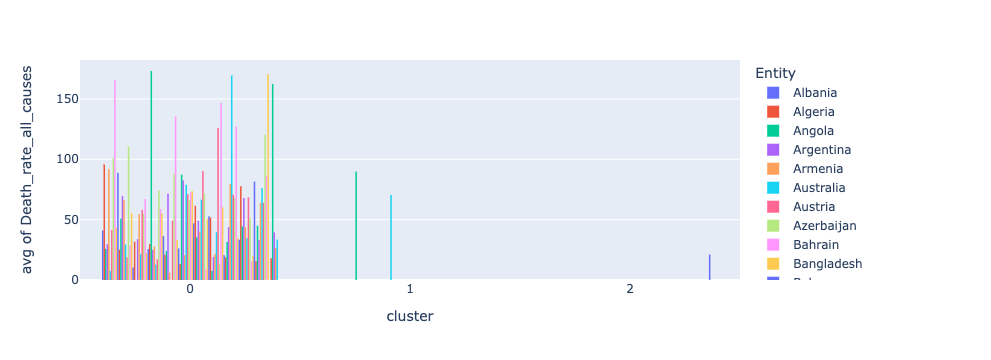

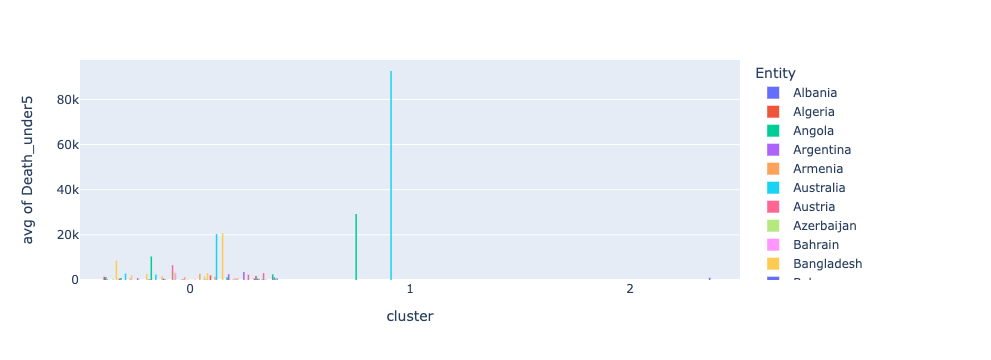

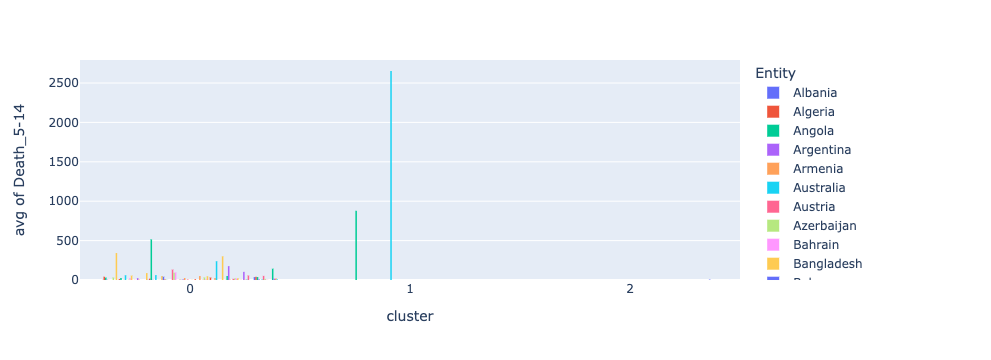

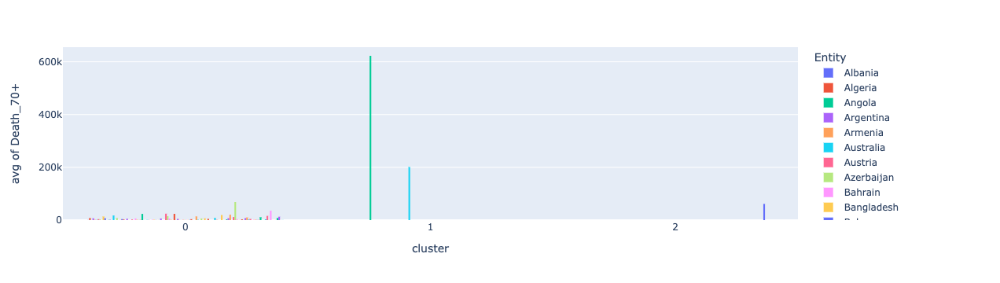

In [34]:
#plot each cluster's mean snap statistics (all) (bar)
stats=['CO2 Emissions','CO2 Emissions Per Cap','Total GHG','Consumption of Ozone','Urban%','Population','GDP','Forest area','Deaths %','Child Mortality','Death_rate_all_causes','Death_under5','Death_5-14','Death_70+']

for stat in stats:
    fig = px.histogram(snap, x='cluster', y=stat, color='Entity', barmode='group', histfunc='avg')
    fig.show()



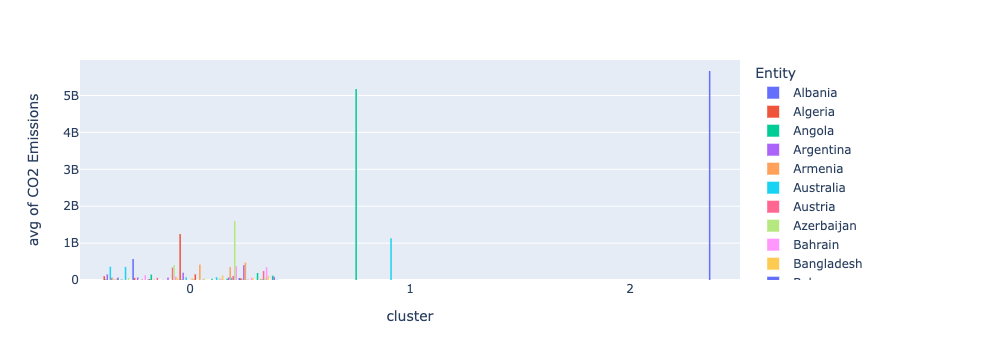

In [35]:
fig = px.histogram(snap, x='cluster', y=snap['CO2 Emissions'], color='Entity', barmode='group', orientation='v', histfunc='avg')
fig.show()

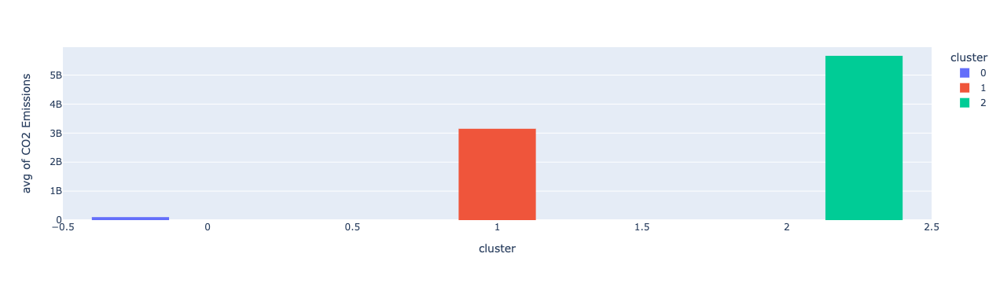

In [36]:
fig = px.histogram(snap, x='cluster', y=snap['CO2 Emissions'], color='cluster', barmode='group', orientation='v', histfunc='avg')
fig.show()

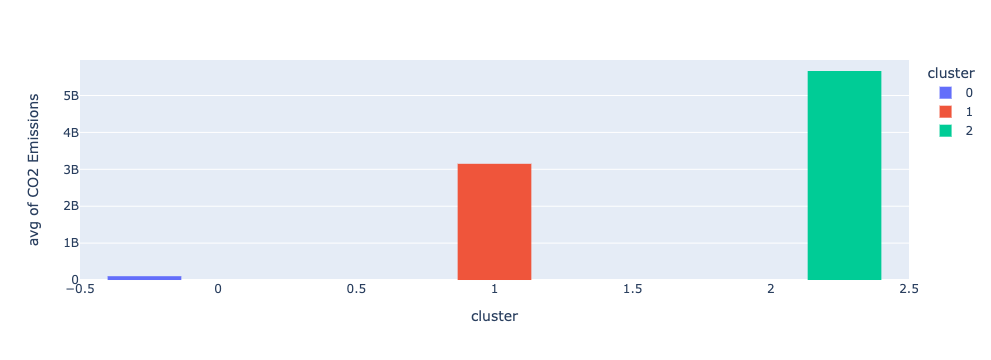

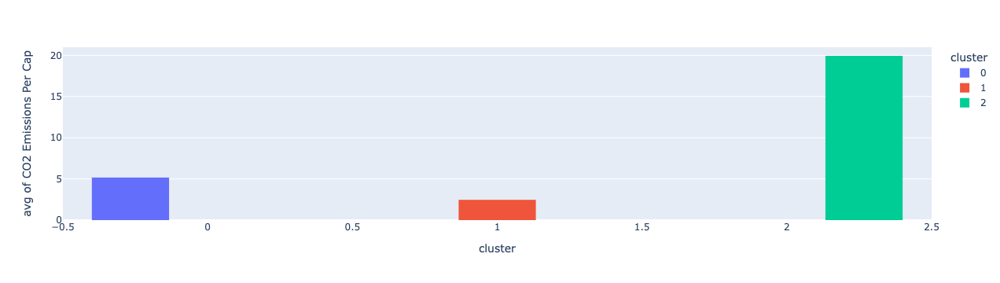

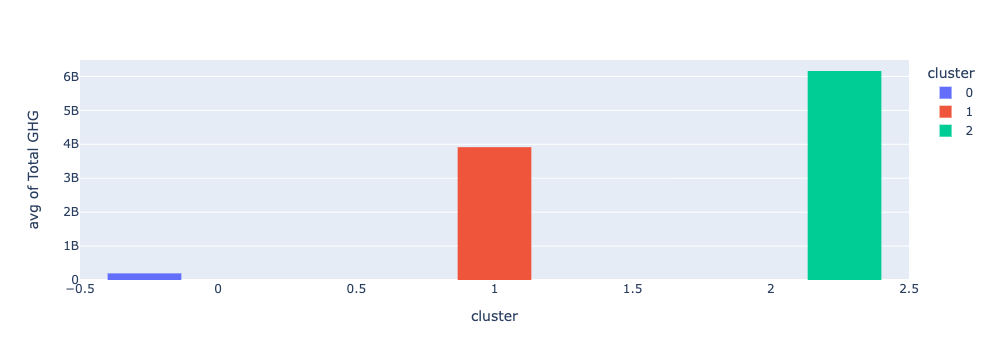

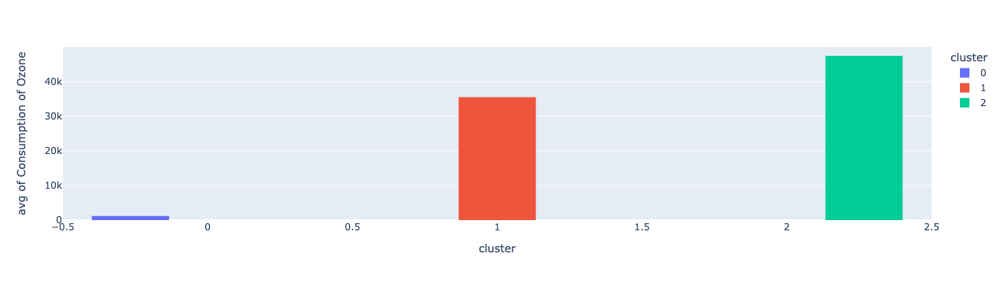

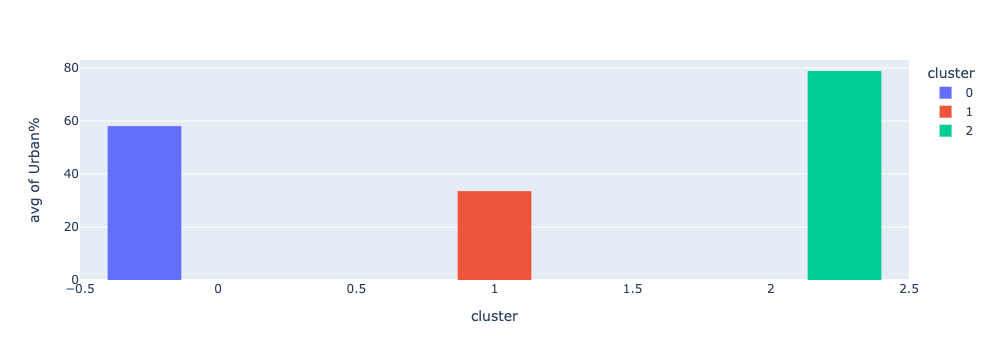

...

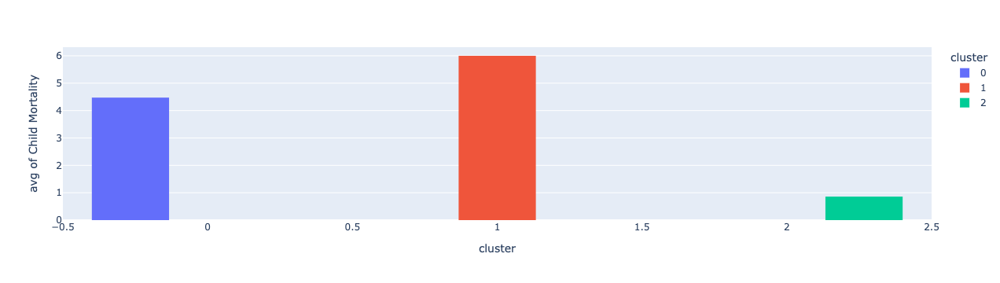

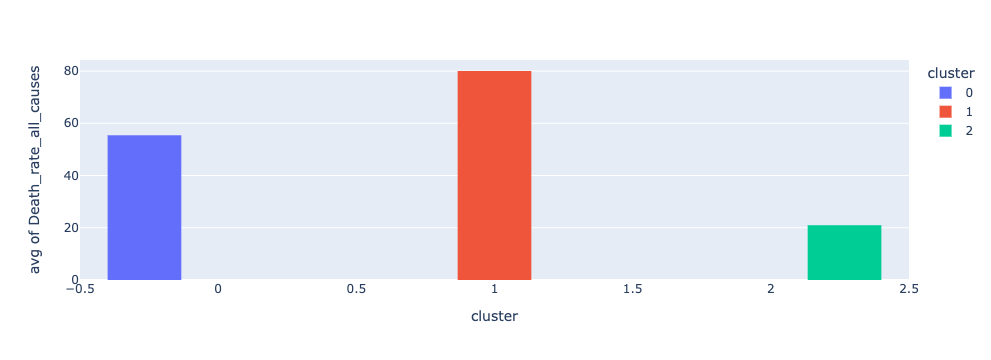

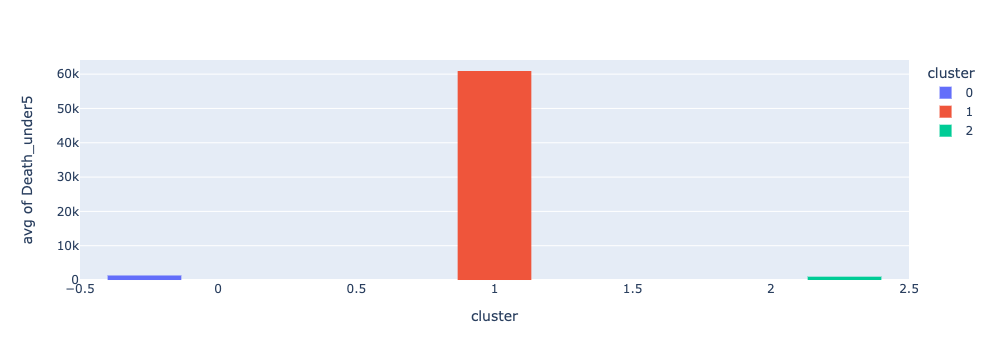

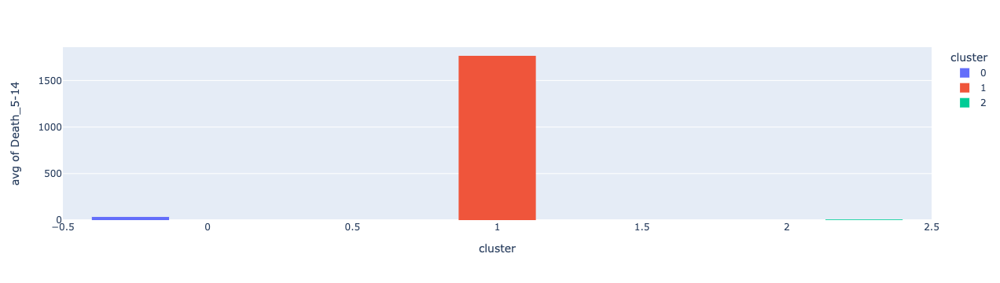

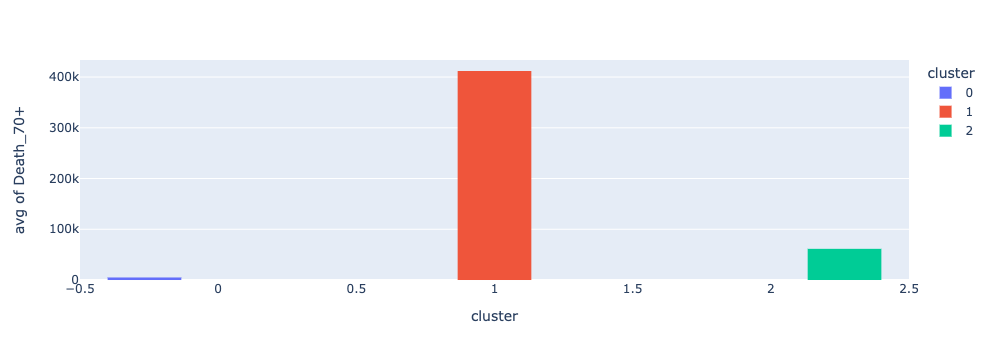

In [37]:
stats=['CO2 Emissions','CO2 Emissions Per Cap','Total GHG','Consumption of Ozone','Urban%','Population','GDP','Forest area','Deaths %','Child Mortality','Death_rate_all_causes','Death_under5','Death_5-14','Death_70+']
for stat in stats:
    fig = px.histogram(snap, x='cluster', y=stat, color='cluster', barmode='group', histfunc='avg')
    fig.show()

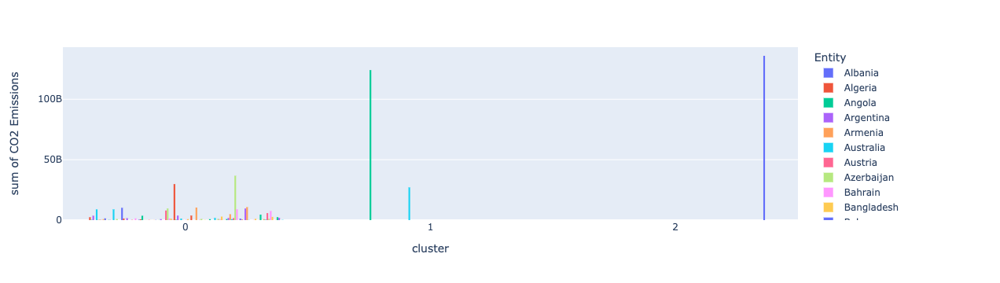

In [38]:
fig = px.histogram(snap, x='cluster', y=snap['CO2 Emissions'], color='Entity', barmode='group')
fig.show()

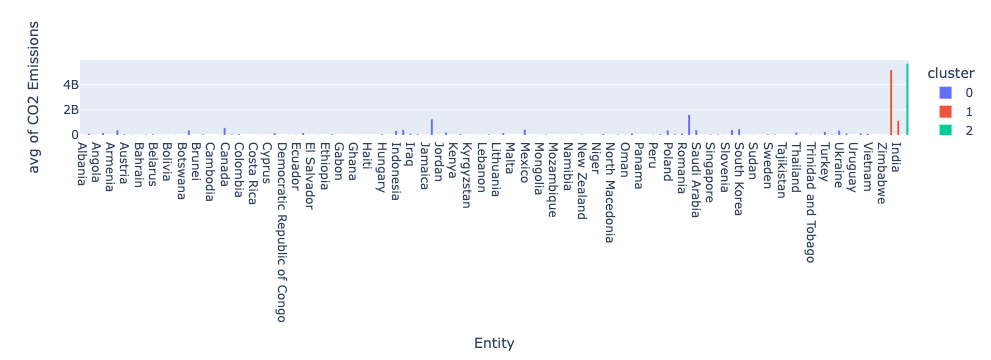

In [39]:
fig = px.histogram(snap, x='Entity', y='CO2 Emissions', color='cluster', barmode='group', histfunc='avg')
fig.show()

In [8]:
#creating line plots for all countries to investigate behavior over time period of analysis

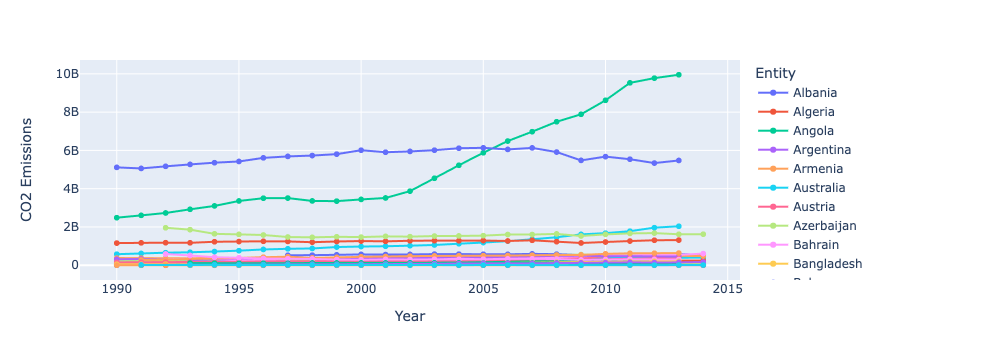

In [52]:
fig = px.line(snap, x='Year', y='CO2 Emissions', color='Entity', markers=True)
fig.show()

In [9]:
#Hand picking some large, populous countries to show behavior without as much noise

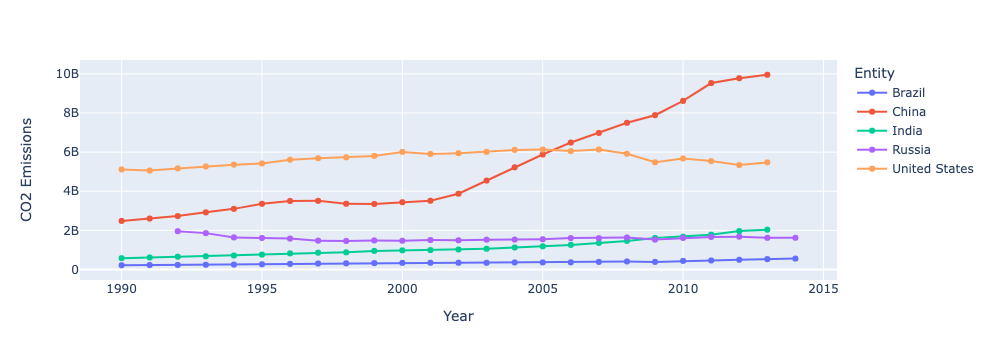

In [42]:
c = ['Brazil', 'India', 'China', 'Russia', 'United States']
fig = px.line(snap[snap['Entity'].isin(c)], x='Year', y='CO2 Emissions', color='Entity',line_group='cluster',markers=True)
fig.show()

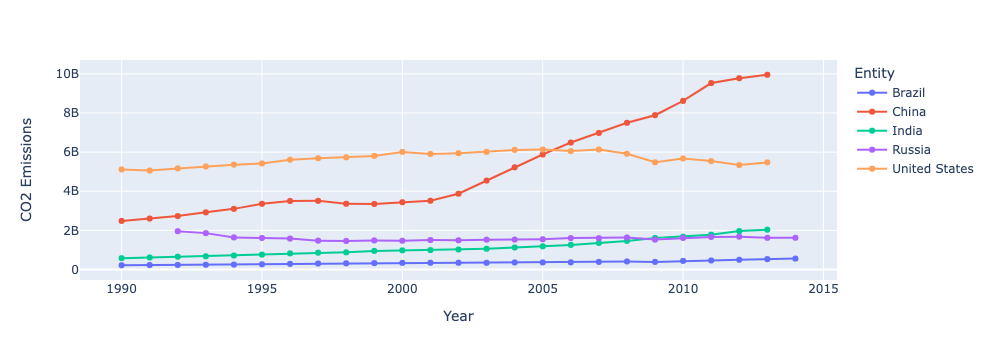

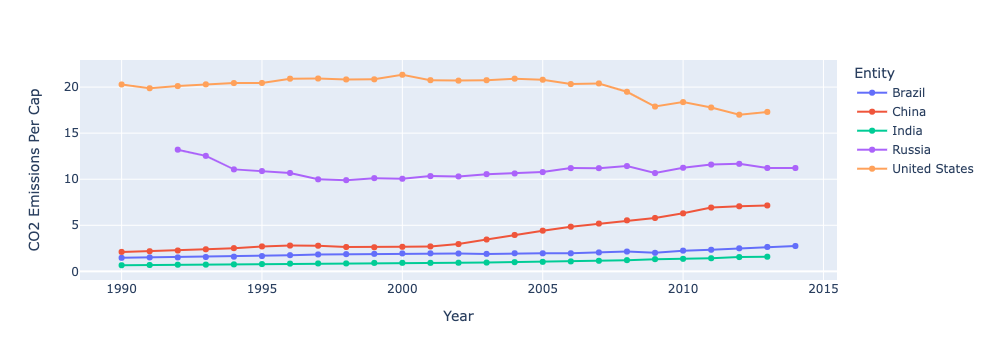

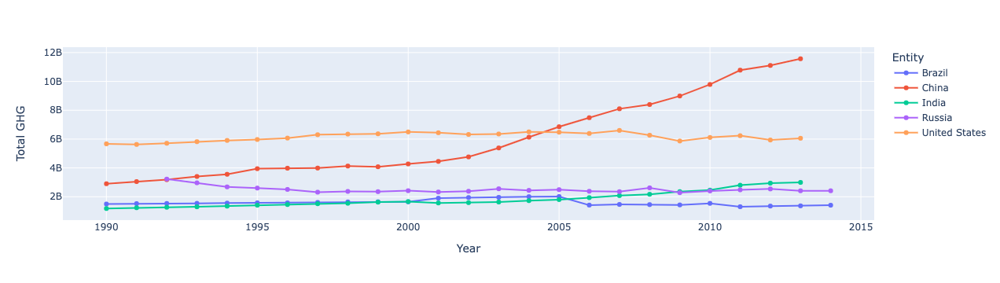

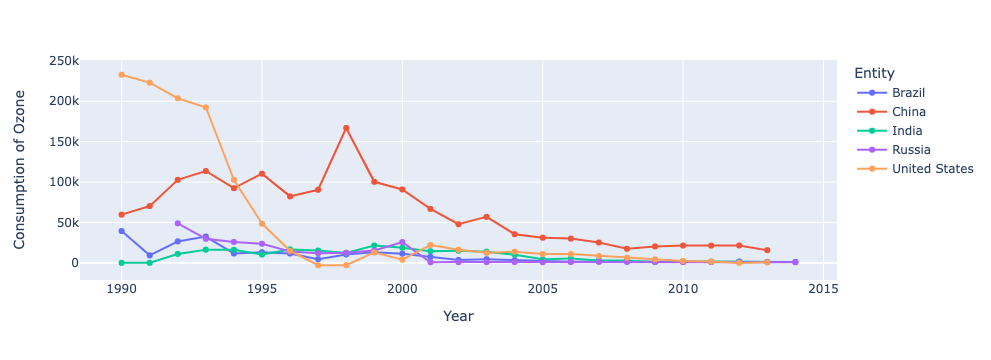

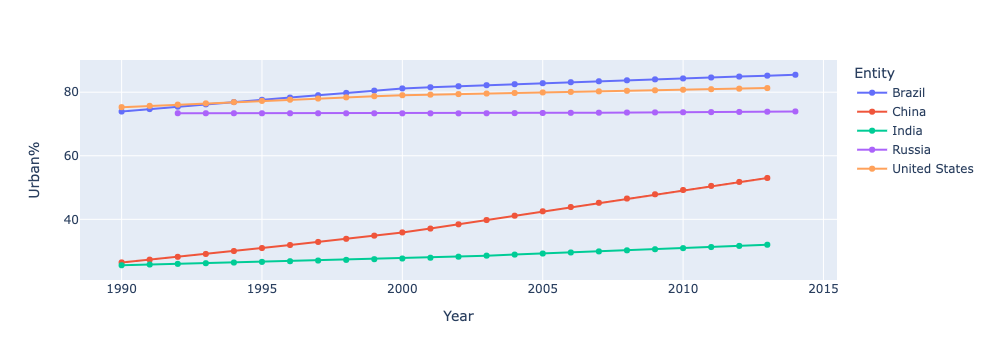

...

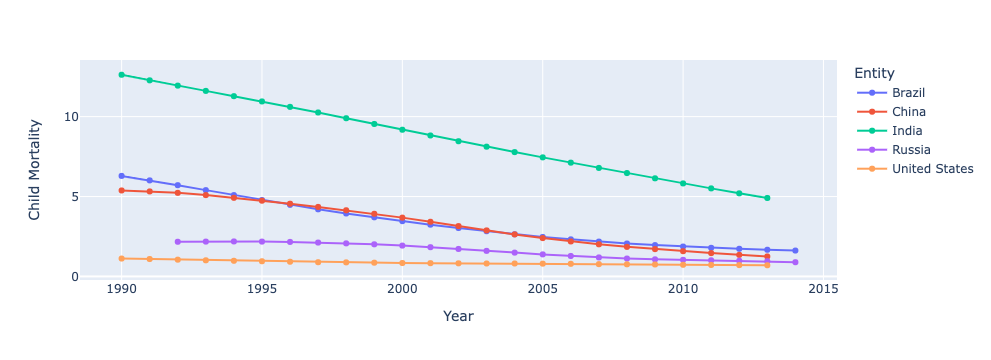

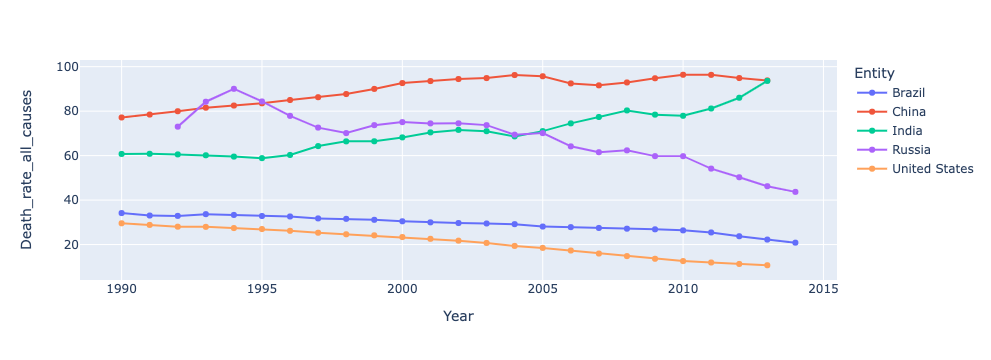

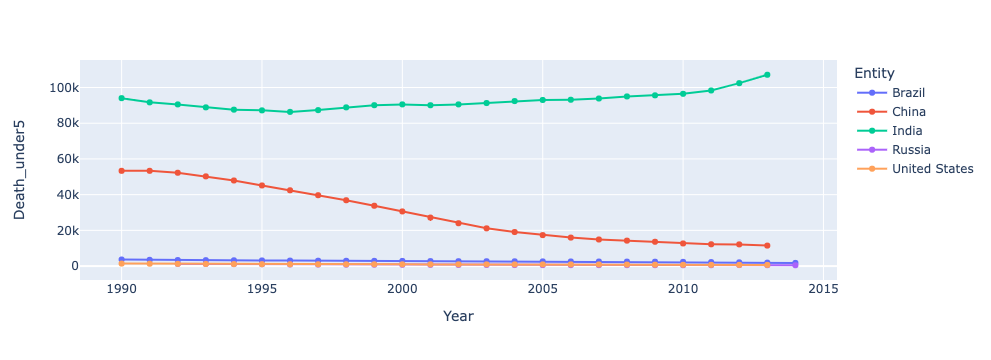

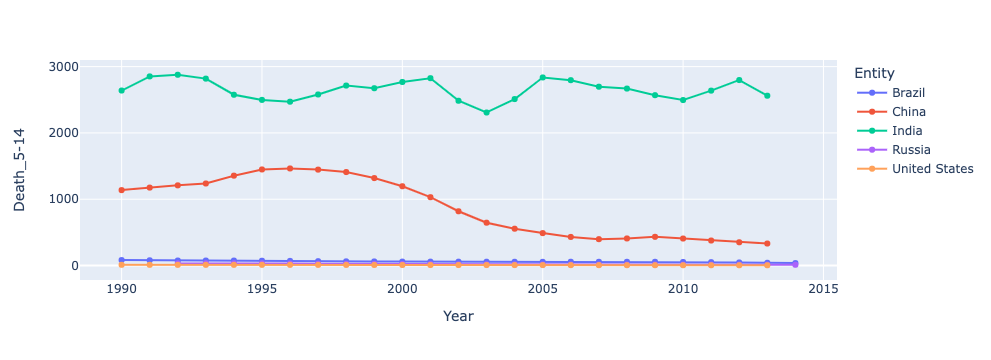

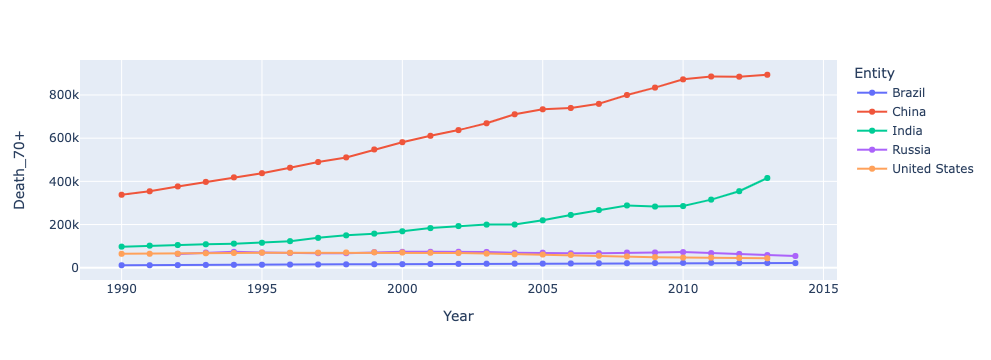

In [43]:
#plot each cluster's snap statistics over time (line)

for stat in stats:
    fig = px.line(snap[snap['Entity'].isin(c)], x='Year', y=stat, color='Entity',line_group='cluster',markers=True)
    fig.show()

In [10]:
#Displaying mean metric value for each cluster

In [44]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
snap.drop(columns='Year').groupby('cluster').mean().T

cluster,0,1,2
CO2 Emissions,102877714.826,3149207442.771,5664404257.417
CO2 Emissions Per Cap,5.169,2.464,19.947
Total GHG,195452293.539,3915458541.667,6159869583.333
Consumption of Ozone,1187.150,35517.384,47467.957
Urban%,58.067,33.545,78.875
Population,180.856,249.008,31.124
GDP,15806.941,3911.556,49302.893
Forest area,30985970.730,124395229.562,305191875.000
Deaths %,10.697,19.831,3.912
Child Mortality,4.473,5.999,0.858


In [11]:
#Demonstrating grouping of cluster data using hand picked subset of countries using a variety of feature relationships

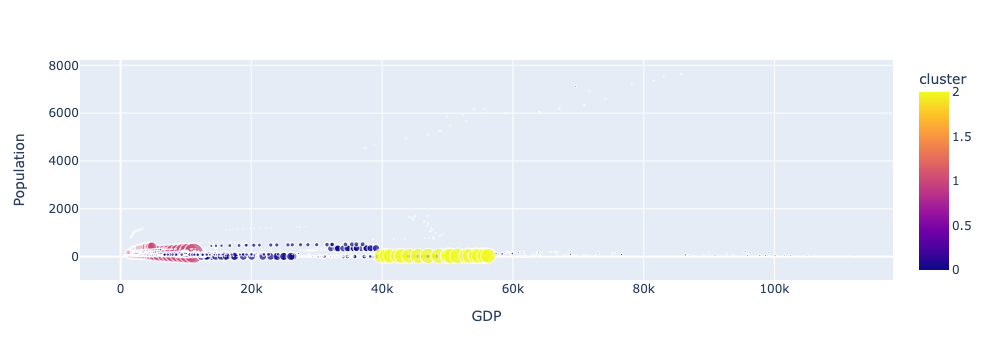

In [45]:
#scatter plots
fig = px.scatter(snap, x='GDP', y='Population', size='CO2 Emissions', color='cluster', hover_name='Entity')
fig.show()

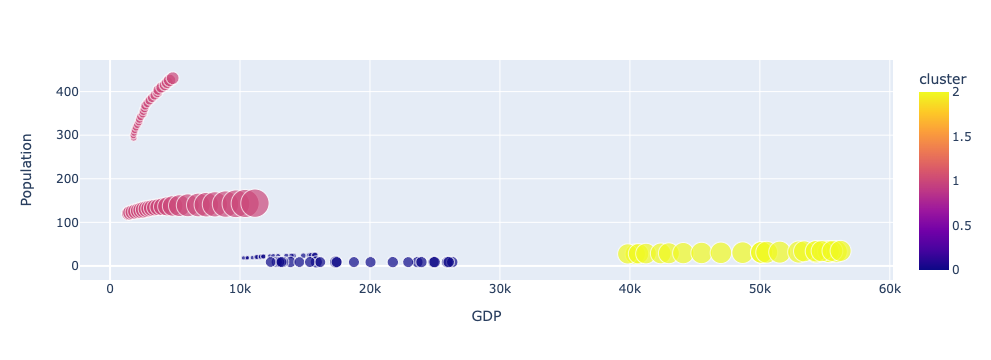

In [46]:
fig = px.scatter(snap[snap['Entity'].isin(c)], x='GDP', y='Population', size='CO2 Emissions', color='cluster', hover_name='Entity')
fig.show()

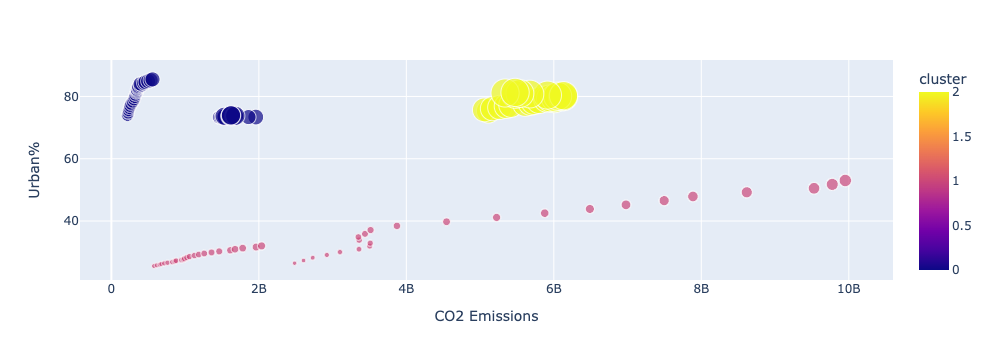

In [47]:
fig = px.scatter(snap[snap['Entity'].isin(c)], x='CO2 Emissions', y='Urban%', size='GDP', color='cluster', hover_name='Entity')
fig.show()

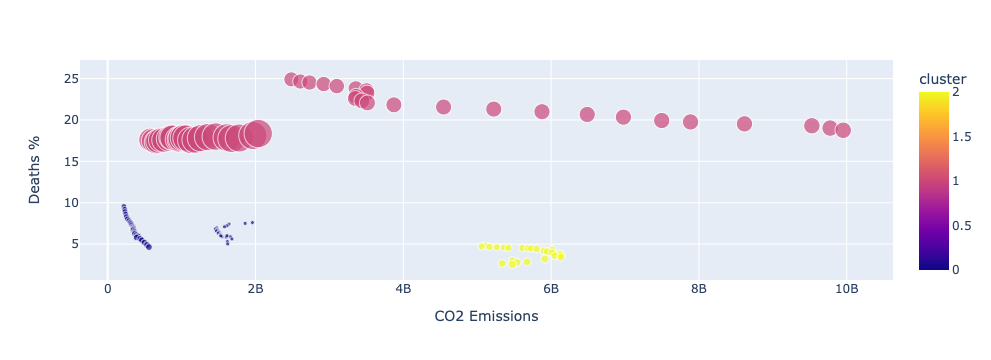

In [48]:
fig = px.scatter(snap[snap['Entity'].isin(c)], x='CO2 Emissions', y='Deaths %', size='Population', color='cluster', hover_name='Entity')
fig.show()